<h1><br>¿Las personas que dedican mucho tiempo jugando League of Legends son mas propensas a desarrollar un transtorno mental?<br></h1>
<p class="texto-justificado">El tiempo que se pasa en línea y/o jugando videojuegos ha aumentado en la vida diaria de un
gran número de personas en todo el mundo.
En consecuencia, se han expresado preocupaciones con respecto al comportamiento adictivo, como equipo queremos ver a través de gráficas estos distintos trastornos. 
    
Decidimos escoger el videojuego League of Legends, ya que es el juego con mayor cantidad de personas jugando actualmente. Con tasas de más de 10 millones de jugadores constantes al mes en todo el mundo.
    
Durante el siguiente informe, trataremos de analizar si la afirmación antes mencionada se puede demostrar con los datos recolectados en el foro de Reddit. Evitando caer en sesgos que no puedan ser demostrados usando una visión empirica y guiada por dichos datos.
</p>

<strong>Fuentes:</strong>
   <i>La fuente de los datos los obtuvimos de: https://www.kaggle.com/divyansh22/online-gaming-anxiety-data  <br>
   Donde la investigación junto a su profundidad, lo pudimos encontrar en: https://osf.io/vnbxk/?view_only=4c54da075e164ea2a5329f5669d03c41 (revisar PDF GamingStudy_Survey, para entender a profundidad el contexto de la investigación realizada
</i>

Equipo compuesto por: <br>
<strong>José Cabrera <br>
José Oteiza<br>
José Vega<br>
Gonzalo Pietraroia<br>
Lautaro Fornaro<br>
</strong>

<h2><br>Los acronimos que se estarán usando en este informe, significan lo siguiente:</br></h2>
<p><strong>GAD</strong> = Generalized Anxiety Disorder</p>
<p><strong>SWL</strong> = Satisfaction with Life Scale</p>
<p><strong>SPIN</strong> = Social Phobia Inventory</p>
<p><strong>SINS</strong> = Single Item Narcissism Scale</p>

<h3>Comenzamos a importar las librerias que vamos a estar requiriendo junto al dataset que contiene todos los datos que necesitamos</h3>

In [3]:
#Manipulacion de datos
import numpy as np
import pandas as pd
import pandas_profiling

#Estadistica
from scipy.stats import norm
 

#Visualizacion
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as dataFaltante
import tkinter



%matplotlib inline





df_gaming = pd.read_csv("./Datasets/Gaming-anxiety.csv", encoding= 'unicode_escape')
df_gaming

,S. No.,Timestamp,GAD1,GAD2,GAD3,GAD4,GAD5,GAD6,GAD7,GADE,...,Birthplace,Residence,Reference,Playstyle,accept,GAD_T,SWL_T,SPIN_T,Residence_ISO3,Birthplace_ISO3
0,1,42052.00437,0,0,0,0,1,0,0,Not difficult at all,...,USA,USA,Reddit,Singleplayer,Accept,1,23,5.0,USA,USA
1,2,42052.00680,1,2,2,2,0,1,0,Somewhat difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,8,16,33.0,USA,USA
2,3,42052.03860,0,2,2,0,0,3,1,Not difficult at all,...,Germany,Germany,Reddit,Singleplayer,Accept,8,17,31.0,DEU,DEU
3,4,42052.06804,0,0,0,0,0,0,0,Not difficult at all,...,USA,USA,Reddit,Multiplayer - online - with online acquaintanc...,Accept,0,17,11.0,USA,USA
4,5,42052.08948,2,1,2,2,2,3,2,Very difficult,...,USA,South Korea,Reddit,Multiplayer - online - with strangers,Accept,14,14,13.0,KOR,USA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,14246,42057.75678,1,0,0,1,0,1,1,Not difficult at all,...,France,France,Reddit,Multiplayer - online - with strangers,Accept,4,28,7.0,FRA,FRA
13460,14247,42057.81185,3,3,3,3,2,3,3,Extremely difficult,...,USA,USA,Reddit,Multiplayer - online - with strangers,Accept,20,23,25.0,USA,USA
13461,14248,42058.16964,0,0,0,0,0,0,0,Not difficult at all,...,Norway,Norway,Reddit,Multiplayer - online - with real life friends,Accept,0,32,10.0,NOR,NOR
13462,14249,42058.24420,3,2,1,3,0,1,3,Somewhat difficult,...,Canada,Canada,Reddit,Singleplayer,Accept,13,16,32.0,CAN,CAN


<h3>Analizamos con la herramienta missingno los datos en su totalidad con una gráfica</h3>

<AxesSubplot:>

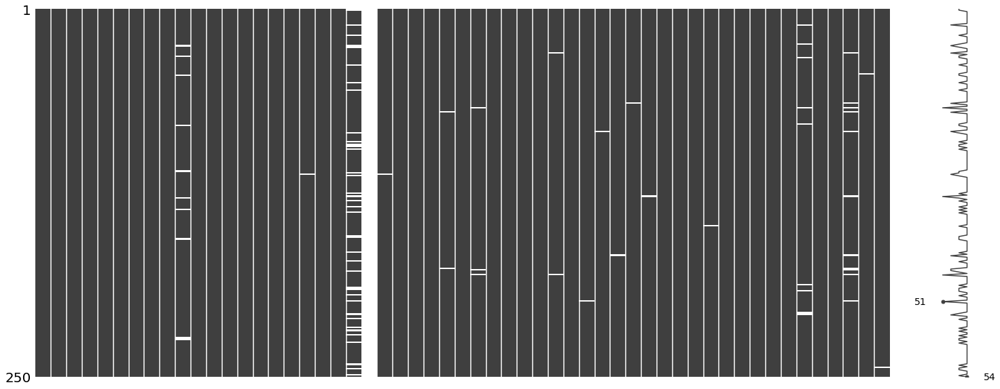

In [4]:
dataFaltante.matrix(df_gaming.sample(250))

<h3>Realizamos la limpieza de datos. Filtramos los registros de la columna "Game", solo queremos los que tienen el valor de "League of Legends"</h3>

In [5]:
# Solo nos enfocaremos en el juego League of Legends
df_league_of_legends = df_gaming[df_gaming['Game'] == "League of Legends"]

# Quitamos los outlayers
df_league_of_legends = df_league_of_legends[df_gaming['Hours'] < 300]

# SPIN_T

df_league_of_legends.shape

C:\Users\fezz2\AppData\Local\Temp/ipykernel_15128/4162485041.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_league_of_legends = df_league_of_legends[df_gaming['Hours'] < 300]


(11290, 55)

In [10]:
pandas_profiling.ProfileReport(df_league_of_legends)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h3>Ahora procedemos a sacar los feature que no nos brinda la información necesaria para la investigación</h3>

In [5]:
df_league_of_legends = df_league_of_legends.drop(columns=[
    'earnings',
    'Reference',
    'accept',
    'Birthplace_ISO3',
    'Residence_ISO3',
    'Timestamp',
    'Birthplace',
    'highestleague',
    'streams',
    'S. No.',
    'Gender',
    'GAD1',          
    'GAD2',          
    'GAD3',          
    'GAD4',          
    'GAD5',          
    'GAD6',     
    'GAD7',          
    'GADE',          
    'SWL1',          
    'SWL2',          
    'SWL3',          
    'SWL4',         
    'SWL5',
    'SPIN1',         
    'SPIN2',         
    'SPIN3',         
    'SPIN4',         
    'SPIN5',         
    'SPIN6',         
    'SPIN7',         
    'SPIN8',         
    'SPIN9',         
    'SPIN10',        
    'SPIN11',        
    'SPIN12',        
    'SPIN13',        
    'SPIN14',        
    'SPIN15',        
    'SPIN16',        
    'SPIN17',
])

<h3>Procedemos a sacar todos los registros que tienen uno de los campos vacio (NaN)</h3>
<p>Podemos ver como 1808 registros fueron eliminados del DataFrame 
(Se podría considerar rellenar esos campos con la mediana)</p>

In [6]:
df_league_of_legends = df_league_of_legends.dropna()
df_league_of_legends

,Game,Platform,Hours,whyplay,League,Narcissism,Age,Work,Degree,Residence,Playstyle,GAD_T,SWL_T,SPIN_T
11,League of Legends,PC,25.0,having fun,Gold,1.0,25,Employed,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,0,33,3.0
27,League of Legends,PC,5.0,having fun,Bronze,3.0,36,Employed,Bachelor (or equivalent),Romania,Multiplayer - online - with strangers,5,26,31.0
33,League of Legends,PC,9.0,improving,Silver 4,4.0,23,Employed,High school diploma (or equivalent),UK,Multiplayer - online - with real life friends,0,26,39.0
35,League of Legends,PC,7.0,having fun,Gold,2.0,25,Student at college / university,Master (or equivalent),USA,Multiplayer - online - with strangers,1,21,29.0
48,League of Legends,PC,25.0,improving,Unranked - Low ELO,3.0,18,Student at college / university,High school diploma (or equivalent),USA,Multiplayer - online - with strangers,11,10,17.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13452,League of Legends,PC,10.0,having fun,Silver V,1.0,27,Student at college / university,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,2,17,23.0
13455,League of Legends,PC,30.0,winning,Gold V,2.0,18,Student at school,High school diploma (or equivalent),Austria,Singleplayer,6,17,14.0
13456,League of Legends,PC,12.0,relaxing,Gold 3,3.0,21,Student at college / university,Master (or equivalent),Morocco,Multiplayer - online - with strangers,5,31,6.0
13457,League of Legends,PC,15.0,improving,silver,1.0,18,Student at school,None,Netherlands,Multiplayer - online - with strangers,7,5,33.0


<h3>Se pasaron todos los valores decimales a valor de número entero</h3>

In [7]:
float_col = df_league_of_legends.select_dtypes(include=['float64'])

for col in float_col:
    df_league_of_legends[col] = df_league_of_legends[col].astype(int)

df_league_of_legends

,Game,Platform,Hours,whyplay,League,Narcissism,Age,Work,Degree,Residence,Playstyle,GAD_T,SWL_T,SPIN_T
11,League of Legends,PC,25,having fun,Gold,1,25,Employed,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,0,33,3
27,League of Legends,PC,5,having fun,Bronze,3,36,Employed,Bachelor (or equivalent),Romania,Multiplayer - online - with strangers,5,26,31
33,League of Legends,PC,9,improving,Silver 4,4,23,Employed,High school diploma (or equivalent),UK,Multiplayer - online - with real life friends,0,26,39
35,League of Legends,PC,7,having fun,Gold,2,25,Student at college / university,Master (or equivalent),USA,Multiplayer - online - with strangers,1,21,29
48,League of Legends,PC,25,improving,Unranked - Low ELO,3,18,Student at college / university,High school diploma (or equivalent),USA,Multiplayer - online - with strangers,11,10,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13452,League of Legends,PC,10,having fun,Silver V,1,27,Student at college / university,Bachelor (or equivalent),USA,Multiplayer - online - with real life friends,2,17,23
13455,League of Legends,PC,30,winning,Gold V,2,18,Student at school,High school diploma (or equivalent),Austria,Singleplayer,6,17,14
13456,League of Legends,PC,12,relaxing,Gold 3,3,21,Student at college / university,Master (or equivalent),Morocco,Multiplayer - online - with strangers,5,31,6
13457,League of Legends,PC,15,improving,silver,1,18,Student at school,None,Netherlands,Multiplayer - online - with strangers,7,5,33


In [8]:
df_league_of_legends.count()

Game          9568
Platform      9568
Hours         9568
whyplay       9568
League        9568
Narcissism    9568
Age           9568
Work          9568
Degree        9568
Residence     9568
Playstyle     9568
GAD_T         9568
SWL_T         9568
SPIN_T        9568
dtype: int64

<h3>Procedemos a ver que relación hay entre los feature escogidos.</h3>

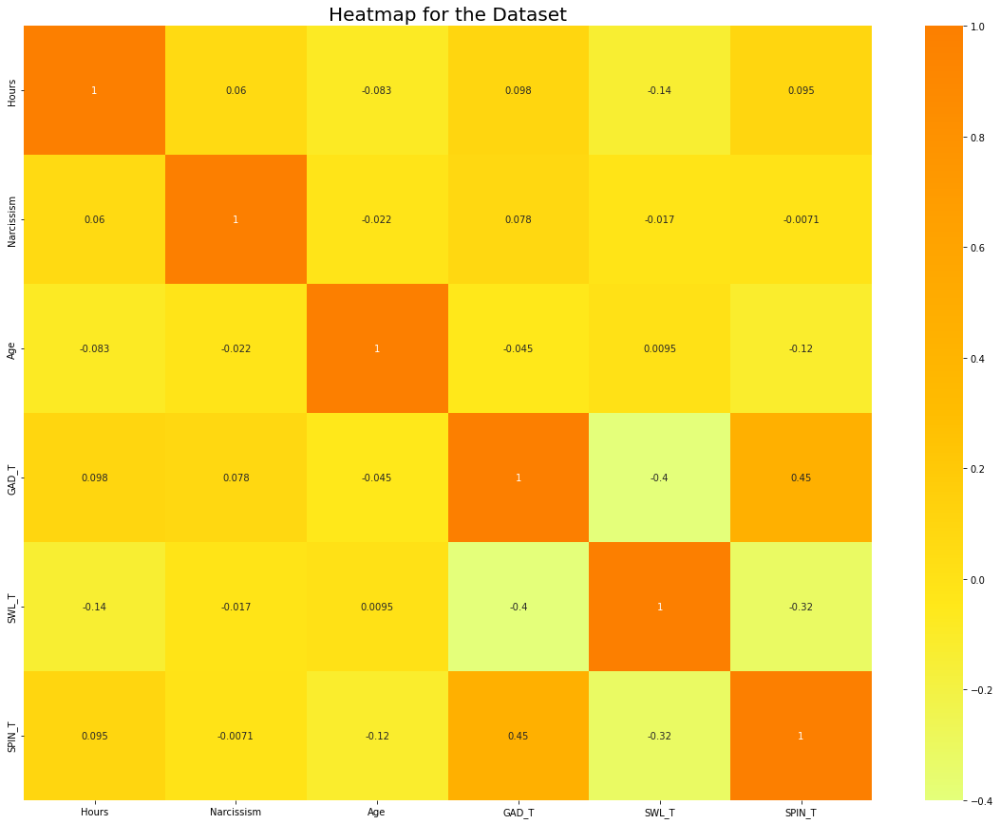

In [9]:
plt.rcParams['figure.figsize'] = (20, 15)
sns.heatmap(df_league_of_legends.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

### Hacemos una distribucion normal en base a las horas de juego

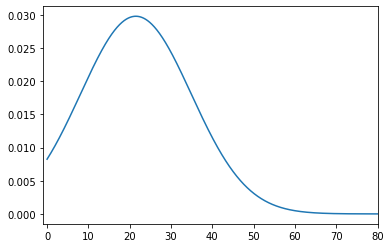

In [20]:
x1=df_league_of_legends['Hours'].min()          #Valor minimo de la columna Hours
x2=df_league_of_legends['Hours'].max()          #Valor maximo de la columna Hours
mean = df_league_of_legends['Hours'].mean()     #Valor promedio de la columna Hours
std = df_league_of_legends['Hours'].std()       #Desviacion estandar de la columna Hours

x_axis = np.arange(x1, x2, 0.001) 

plt.plot(x_axis, norm.pdf(x_axis, mean, std)) 
plt.xlim(-1,80)
plt.show() 

## Univariado

#### Podemos observar que la cantidad de personas que juegan va disminuyendo mientras avanza su vida laboral y academica

<AxesSubplot:xlabel='Degree', ylabel='count'>

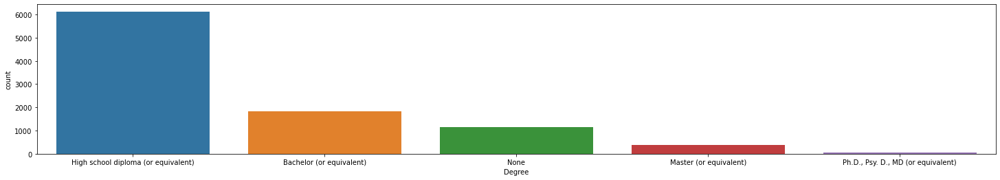

In [14]:
plt.figure(figsize=(25, 4))
sns.countplot(x = df_league_of_legends.Degree.dropna(), order = df_league_of_legends.Degree.value_counts().index)

#### El dispositivo de juego mas usado es el PC, esto es paralelo con el juego mas jugado. dado que solo se puede en computador

<AxesSubplot:xlabel='Platform', ylabel='count'>

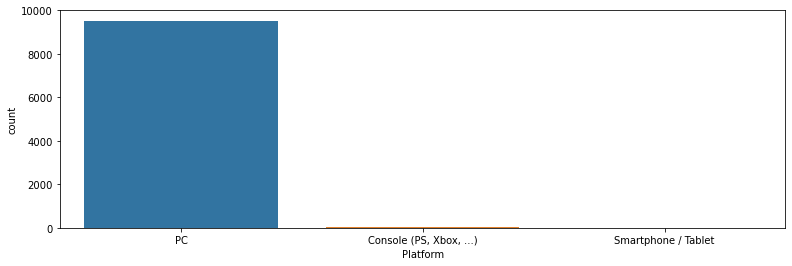

In [15]:
plt.figure(figsize=(13, 4))
sns.countplot(x = df_league_of_legends.Platform.dropna(), order = df_league_of_legends.Platform.value_counts().index)

### El motivo por el cual juegan las personas puede afectar directamente con trastornos de todo tipo. Aqui podemos observar 5 los principales motivos

<AxesSubplot:xlabel='whyplay', ylabel='count'>

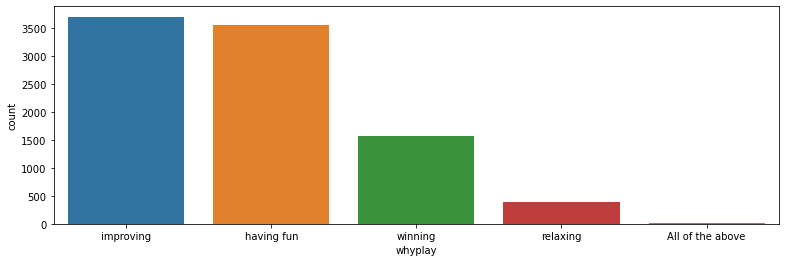

In [16]:
plt.figure(figsize=(13, 4))
sns.countplot(x = df_league_of_legends.whyplay.dropna(), order = df_league_of_legends.whyplay.value_counts().head(5).index)

## Bivariado

### Podemos ver una relacion entre la edad y el narcisismo, Segun nuestro dataset a mayor edad mayor es el nivel de narcisimo en la personas

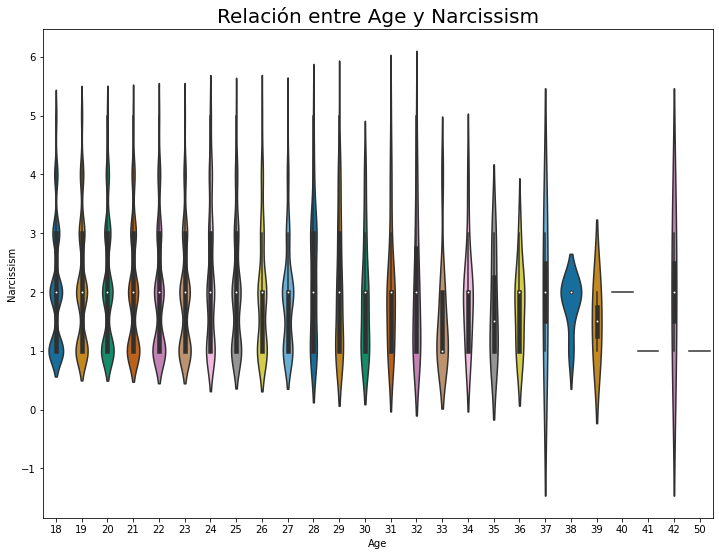

In [17]:
plt.rcParams['figure.figsize'] = (12, 9)
sns.violinplot(x = df_league_of_legends['Age'], y = df_league_of_legends['Narcissism'], palette = 'colorblind')
plt.title('Relación entre Age y Narcissism', fontsize = 20, fontweight = 30)
plt.show()

### Gad: Desorden de ansiedad Generalizada. Podemos ver como se mantiene durante los primero años, pero despues el muestreo disminuye aumentando la media de la variable 

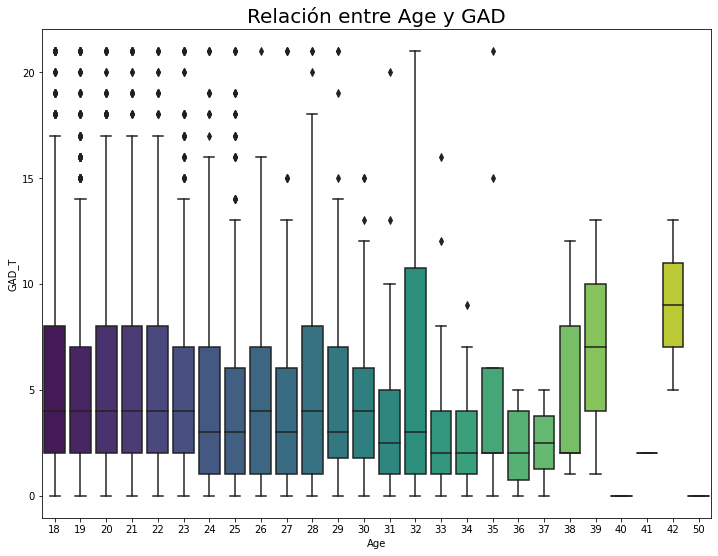

In [19]:
plt.rcParams['figure.figsize'] = (12, 9)
sns.boxplot(x = df_league_of_legends['Age'], y = df_league_of_legends['GAD_T'], palette = 'viridis')
plt.title('Relación entre Age y GAD', fontsize = 20)
plt.show()

### Spin: Fobia social. Podemos ver que en este trastorno la media umneta considerablemente en comparacion con la ansiedad. Teniendo en cuenta que presenta mas outliers en los primeros años 

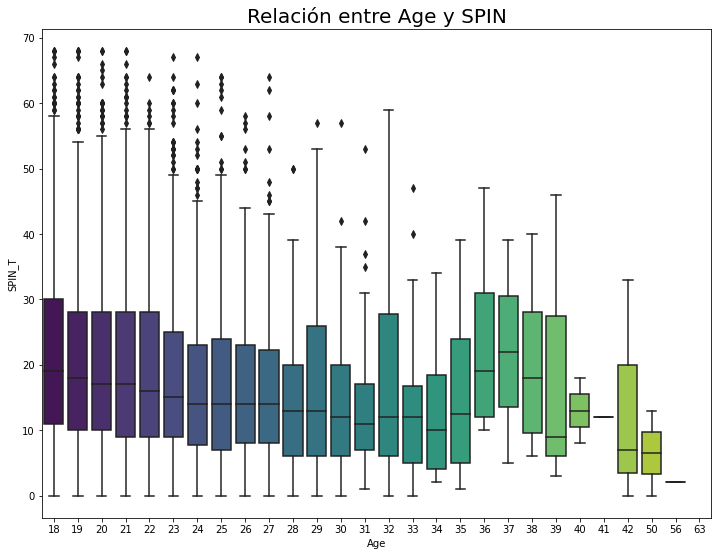

In [21]:
plt.rcParams['figure.figsize'] = (12, 9)
sns.boxplot(x = df_league_of_legends['Age'], y = df_league_of_legends['SPIN_T'], palette = 'viridis')
plt.title('Relación entre Age y SPIN', fontsize = 20)
plt.show()

## Multivariado

<h3>Podemos ver como los jovenes de entre 20 a 30 años son mas propensos a jugar mas de 40 horas a la semana, en su mayoria siendo o estudiantes o desempleados.</h3>

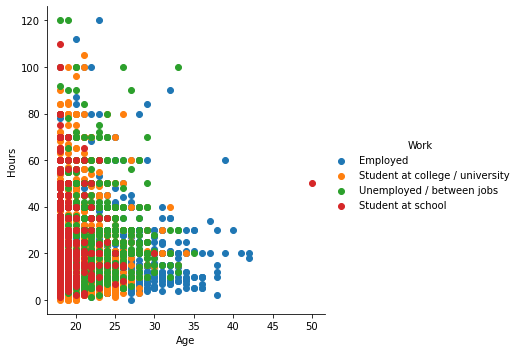

In [10]:
sns.FacetGrid(df_league_of_legends, hue = 'Work', height = 5).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

<h3>Recordemos que "SWL_T" es la satifacción total con la vida, por lo que la siguiente gráfica se leería de la siguiente manera:</h3> <br>
5: es extremadamente insatisfecho con la vida. <br>
35: Es extremanadamente satisfecho con la vida

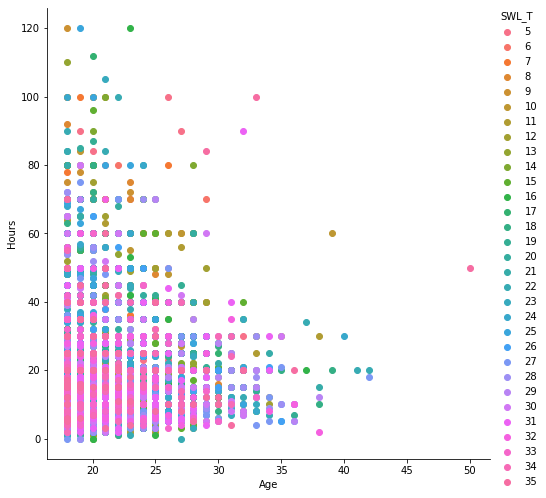

In [11]:
sns.FacetGrid(df_league_of_legends, hue = 'SWL_T', height = 7).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

<h3>Recordemos que "SPIN_T" es la fobia social total, por lo que la siguiente gráfica se leería de la siguiente manera:</h3> <br>
0: Es nulo problema para poder socializar. <br>
68: Es imposibilidad absoluta para convivir con otros humanos

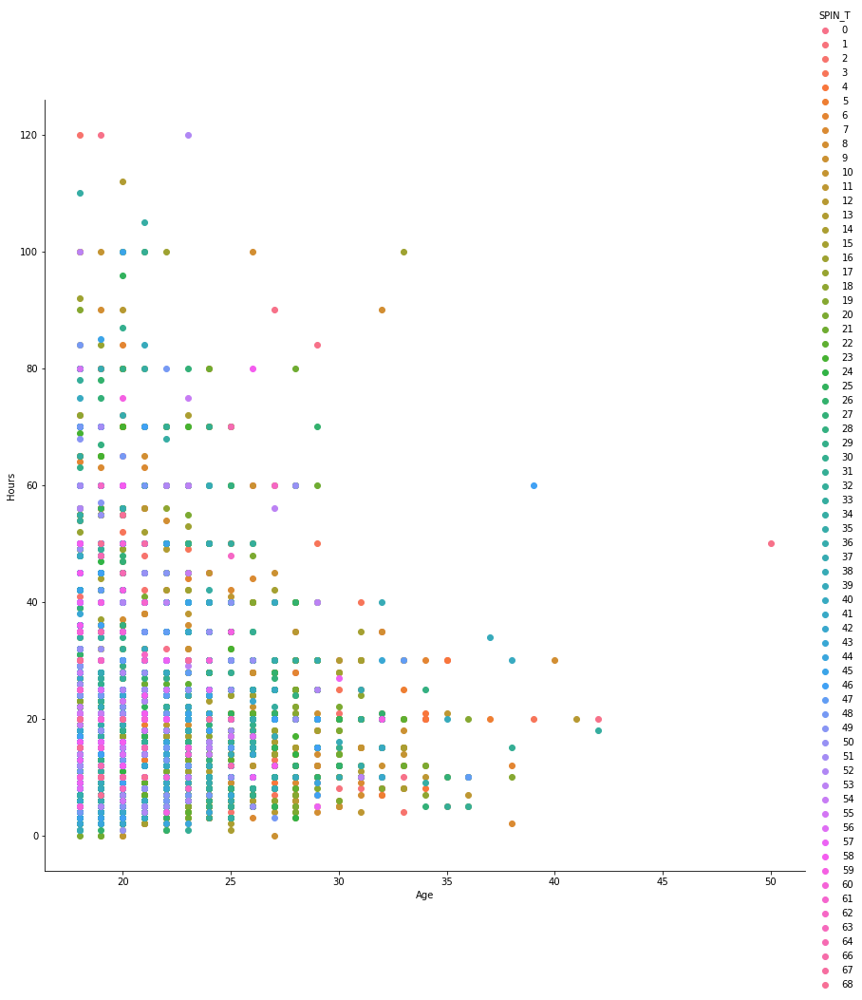

In [12]:
sns.FacetGrid(df_league_of_legends, hue = 'SPIN_T', height = 12).map(plt.scatter,'Age','Hours').add_legend();
plt.show()

<h3>Recordemos que "GAD_T" es desorden de axiedad generalidaza total, por lo que la siguiente gráfica se leería de la siguiente manera:</h3> <br>
0: Es nula axiedad social. <br>
21: Es absoluta axiedad social, al borde de agorafobia.

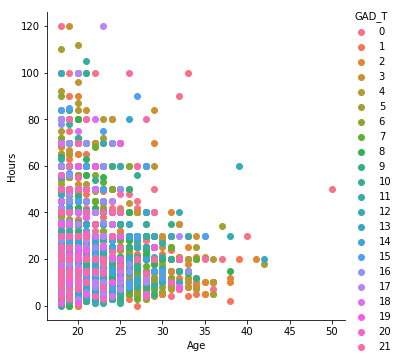

In [13]:
sns.FacetGrid(df_league_of_legends, hue = 'GAD_T', height = 5).map(plt.scatter,'Age','Hours').add_legend();
plt.show()